In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
!pip install cartopy
import cartopy
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from PIL import Image #for GIF
import os #for save

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 125.8 MB/s eta 0:00:00


In [ ]:
MHW_climatology = pd.read_csv("/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/result_mhw_2021_climatology.csv")
MHW_climatology

,doy,t,temp,seas,thresh,threshCriterion,durationCriterion,event,event_no,lat,long
0,1,2021-01-01,285.109994,286.1556,287.4384,False,False,False,NaN,34.025002,125.974998
1,2,2021-01-02,284.749994,286.1067,287.3914,False,False,False,NaN,34.025002,125.974998
2,3,2021-01-03,284.609994,286.0582,287.3434,False,False,False,NaN,34.025002,125.974998
3,4,2021-01-04,284.669994,286.0095,287.2933,False,False,False,NaN,34.025002,125.974998
4,5,2021-01-05,284.919994,285.9611,287.2412,False,False,False,NaN,34.025002,125.974998
...,...,...,...,...,...,...,...,...,...,...,...
9435239,361,2021-12-26,277.519994,276.0622,277.2327,True,True,True,8.0,42.025002,133.975006
9435240,362,2021-12-27,277.509994,275.9952,277.1459,True,True,True,8.0,42.025002,133.975006
9435241,363,2021-12-28,277.139994,275.9302,277.0653,True,True,True,8.0,42.025002,133.975006
9435242,364,2021-12-29,277.169994,275.8670,276.9846,True,True,True,8.0,42.025002,133.975006


In [ ]:
MHW_climatology["t"]  = pd.to_datetime(MHW_climatology["t"])
MHW_climatology["year"] = MHW_climatology["t"].dt.year
MHW_climatology["temp"]  = MHW_climatology["temp"]   - 273.15
result = MHW_climatology[['lat', 'long', 't' , 'temp', 'seas' ,	'thresh'	, "event"]]

In [ ]:
save_folder = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/gIf_picture'

In [ ]:
##그림파일 생성-실행시 save_folder에 저장됩니다.
unique_dates = result['t'].unique()
min_value = min(result["temp"])
max_value = max(result["temp"])
i = 0
for dates in unique_dates :
  df = result[result["t"] == dates]
  lats = df['lat'].values
  lons = df['long'].values
  events = df['event'].values
  temps = df['temp'].values
  lat_grid, lon_grid = np.meshgrid(np.unique(lats), np.unique(lons))
  temp_grid = temps.reshape(lat_grid.shape)
  event_grid = events.reshape(lat_grid.shape)

  fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
  extent = [df['long'].min(), df['long'].max(), df['lat'].min(), df['lat'].max()]
  ax.set_extent(extent, crs=ccrs.PlateCarree())
  ax.coastlines(resolution='10m', color='black')
  cmap = plt.get_cmap('jet')
  contour = ax.contourf(lon_grid, lat_grid, temp_grid, transform=ccrs.PlateCarree(), cmap=cmap,
                        vmin=min_value, vmax=max_value,levels= 25)
  event_lats = lat_grid[event_grid]
  event_lons = lon_grid[event_grid]
  ax.scatter(event_lons, event_lats, c='brown', s=1, transform=ccrs.PlateCarree(), label='Event Location')
  cbar = plt.colorbar(contour, extend='both', orientation='vertical')
  cbar.set_label('Sea Surface Temperature(°C)')
  date_obj = pd.to_datetime(dates)
  formatted_date = date_obj.strftime('%Y-%m-%d')
  plt.title(f'Sea Surface Temperature on { formatted_date}')
  i = i+1
  file_name = f'{save_folder}/sst_plot_{i}.png'
  plt.savefig(file_name, format='png')
  plt.close()

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


In [ ]:
file_list = os.listdir()
new_directory = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/gIf_picture'  # GIF를 생성할 이미지 파일이 저장된 경로 = save_folder
os.chdir(new_directory)

GIF123

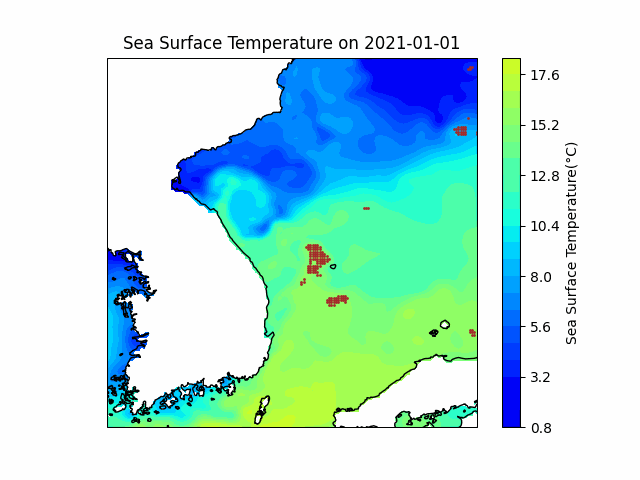

In [ ]:
start_index= 1
end_index = 90
al = []
for i in np.arange(start_index, end_index, 1):
    st = f'sst_plot_{i}.png'
    al.append(st)
frames = []
for i in al:
    new_frame = Image.open(i)
    frames.append(new_frame)
# 파일 저장 경로 설정 (Google Colab에서는 /content/에 저장됩니다.)
gif_path = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/GIF/GIF_123.gif'
# GIF made
frames[0].save(gif_path, format='GIF', append_images=frames[1:], save_all=True, duration= 200, loop=0)
# GIF out
from IPython.display import Image as IPImage
IPImage(filename=gif_path)

GIF456

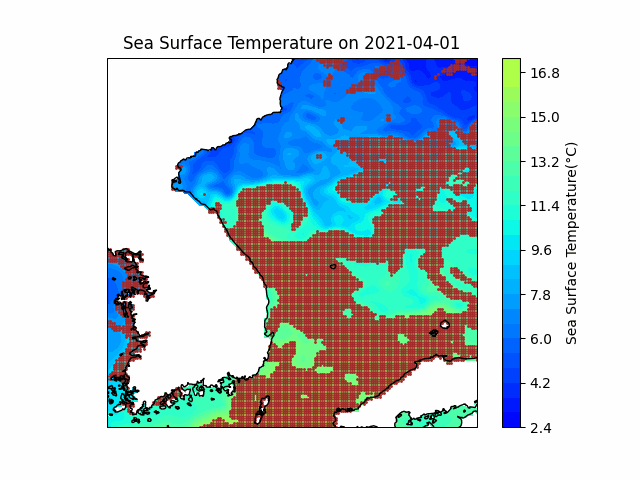

In [ ]:
start_index= 91
end_index = 181
al = []
for i in np.arange(start_index, end_index, 1):
    st = f'sst_plot_{i}.png'
    al.append(st)
frames = []
for i in al:
    new_frame = Image.open(i)
    frames.append(new_frame)
# 파일 저장 경로 설정 (Google Colab에서는 /content/에 저장됩니다.)
gif_path = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/GIF/GIF_456.gif'
# GIF made
frames[0].save(gif_path, format='GIF', append_images=frames[1:], save_all=True, duration=200, loop=0)
# GIF out
from IPython.display import Image as IPImage
IPImage(filename=gif_path)

GIF789

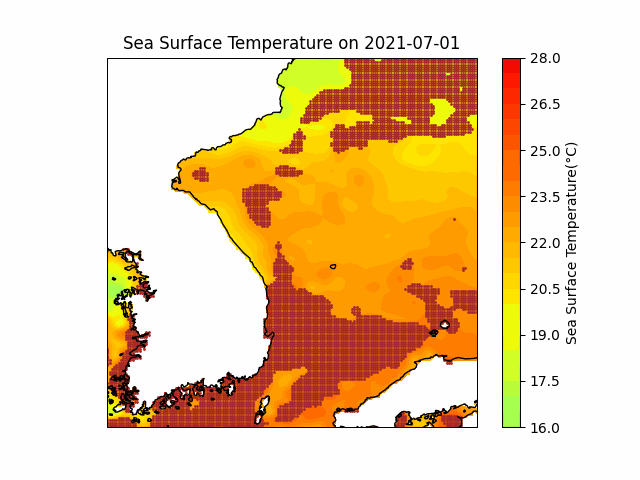

In [ ]:
start_index= 182
end_index = 273
al = []
for i in np.arange(start_index, end_index, 1):
    st = f'sst_plot_{i}.png'
    al.append(st)
frames = []
for i in al:
    new_frame = Image.open(i)
    frames.append(new_frame)
# 파일 저장 경로 설정 (Google Colab에서는 /content/에 저장됩니다.)
gif_path = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/GIF/GIF_789.gif'
# GIF made
frames[0].save(gif_path, format='GIF', append_images=frames[1:], save_all=True, duration=200, loop=0)
# GIF out
from IPython.display import Image as IPImage
IPImage(filename=gif_path)

GIF101112

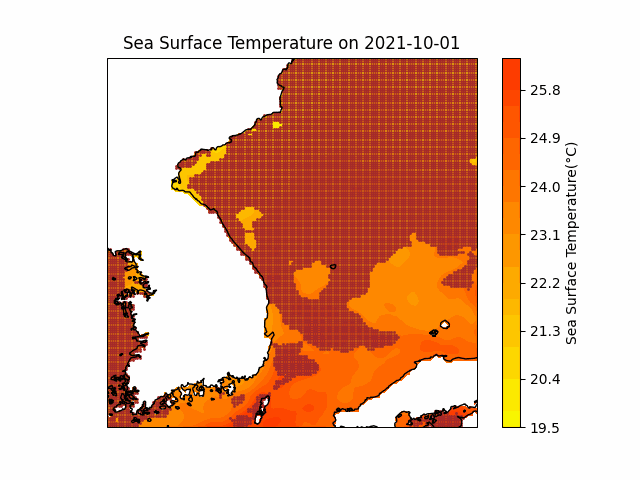

In [ ]:
start_index= 274
end_index = 364
al = []
for i in np.arange(start_index, end_index, 1):
    st = f'sst_plot_{i}.png'
    al.append(st)
frames = []
for i in al:
    new_frame = Image.open(i)
    frames.append(new_frame)
# 파일 저장 경로 설정 (Google Colab에서는 /content/에 저장됩니다.)
gif_path = '/content/drive/MyDrive/Yeongsil_Miracle/GIF_process/GIF/GIF_101112.gif'
# GIF made
frames[0].save(gif_path, format='GIF', append_images=frames[1:], save_all=True, duration=200, loop=0)
# GIF out
from IPython.display import Image as IPImage
IPImage(filename=gif_path)